# Requirements and Libraries

In [1]:
import numpy as np
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

import warnings
warnings.filterwarnings("ignore")

from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!cp -r '/content/drive/MyDrive/MSC/Fall2023/AADNN/HW#5/Homework5_dataset.zip' '/content'

In [3]:
!unzip -qq '/content/Homework5_dataset'

In [4]:
!pip install efficientnet_pytorch --quiet

  Preparing metadata (setup.py) ... done


# Utils

In [25]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import glob
import random
from  matplotlib import pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
from efficientnet_pytorch import EfficientNet
import numpy
from torchvision import transforms

In [26]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

def plot_roc_curve(model, loader, typeL):

    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    similarities = []
    ground_truth = []
    with torch.no_grad():
        for idx, batch in enumerate(loader):
            img1, img2, img3 = batch
            img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
            output1, output2, output3 = model(img1, img2, img3)
            positive_similarity = F.cosine_similarity(output1, output2)
            negative_similarity = F.cosine_similarity(output1, output3)

            similarities.extend(positive_similarity.cpu().numpy())
            ground_truth.extend([1] * positive_similarity.size(0))

            similarities.extend(negative_similarity.cpu().numpy())
            ground_truth.extend([0] * negative_similarity.size(0))

    fpr, tpr, thresholds = roc_curve(ground_truth, similarities)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for ' + typeL)
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr

In [27]:
def calc_fpr_tpr(fpr, tpr, m = [0.5, 0.1, 0.01, 0.001]):

    for target_fpr in m:

        fpr_array = np.asarray(fpr)
        closest_fpr_idx = (np.abs(fpr_array - target_fpr)).argmin()
        closest_fpr = fpr_array[closest_fpr_idx]
        corresponding_tpr = tpr[closest_fpr_idx]

        print(f"For target FPR of {target_fpr:.3f}, closest achieved FPR is {closest_fpr:.4f} with corresponding TPR of {corresponding_tpr:.4f}")

In [28]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

def ground_truth(test_single_images, idx):
  same_pairs = []
  img1 = test_single_images[idx]
  label1 = img1.split("/")[-1][:4]
  for i in range(1, len(img_list)):
    if i != idx:
      img2 = img_list[i]
      label2 = img2.split("/")[-1][:4]
      label = 1 if label1 == label2 else 0
      if label == 1:
        same_pairs.append(img2)

  return same_pairs




def plot_images(img_paths):

  num_imgs = len(img_paths)
  cols = min(5, num_imgs)
  rows = num_imgs // cols
  rows += num_imgs % cols > 0

  fig, axs = plt.subplots(rows, cols, figsize=(20, rows*3))

  for i, img_path in enumerate(img_paths):
    img = Image.open(img_path)
    if rows == 1:
        axs[i % cols].imshow(img)
        axs[i % cols].axis('off')
    else:
        row = i // cols
        col = i % cols
        axs[row, col].imshow(img)
        axs[row, col].axis('off')

  plt.tight_layout()
  plt.show()

In [29]:
def top_10(person_loader, test_single_images, idx):
  transforms = getTransforms()
  distance = numpy.array([])

  anchor = Image.open(test_single_images[idx]).convert("RGB") # Reading image
  plt.imshow(anchor)
  plt.show()
  anchor = transforms(anchor).unsqueeze(dim=0).to(device)

  p_loop = tqdm(enumerate(person_loader, 1), total=len(person_loader),  position=0, leave=True)
  for _, batch in p_loop:
      optimizer.zero_grad()
      img1 = batch[0].to(device)
      output1, output2, _ = model(anchor, img1, img1)
      euclidean_distance = nn.functional.pairwise_distance(output1, output2, keepdim=True).detach().cpu().numpy()
      distance = numpy.append(distance, euclidean_distance)

  top10_index = sorted(range(len(distance)), key=lambda k: distance[k])[:10]

  fig, axs = plt.subplots(2, 5, figsize=(15, 6))

  for i, img_idx in enumerate(top10_index):
      img = Image.open(test_single_images[img_idx]).convert("RGB")
      img = np.array(img)
      row = i // 5
      col = i % 5
      axs[row, col].imshow(img)
      axs[row, col].axis('off')

  plt.tight_layout()
  plt.show()

In [30]:
def save_model(file_path, model, optimizer):
    """
    In this function, a model is saved.Usually save model after training in each epoch.
    ------------------------------------------------
    Args:
        - model (torch.nn.Module)
        - optimizer (torch.optim)
        - file_path (str): Path(Folder) for saving the model
        - file_name (str): name of the model checkpoint to save
    """
    state_dict = dict()
    state_dict["model"] = model.state_dict()

    if optimizer is not None:
        state_dict["optimizer"] = optimizer.state_dict()
    torch.save(state_dict, file_path)


def load_model(ckpt_path, model, optimizer=None):
    """
    Loading a saved model and optimizer (from checkpoint)
    """
    checkpoint = torch.load(ckpt_path, map_location=torch.device("cpu"))
    model.load_state_dict(checkpoint["model"])
    if (optimizer != None) & ("optimizer" in checkpoint.keys()):
        optimizer.load_state_dict(checkpoint["optimizer"])
    return model, optimizer

# Dataset

## Dataset utils

In [31]:
def read_images(train_split=0.8):
    DIR_ = "/content/Homework5_dataset"
    images = []
    images += glob.glob(DIR_ + '/*.jpg')
    return images

In [32]:
def create_dictinary(img_list):
  classes = dict()
  for i, pth in enumerate(img_list):
    key = pth.split("/")[-1][:4]
    if key not in classes.keys():
      classes[key] = []
    classes[key].append([pth, i])
  # print(classes.keys())
  # print(len(classes.keys()))
  return classes

In [33]:
import random

def generate_triads(dict_paths, img_list, item, max_num):

    triplets = []

    while len(triplets) <= max_num:
      for key in item:
        for entry in dict_paths[key]:

          img1 = entry[0]
          idx = entry[1]
          label1 = img1.split("/")[-1][:4]

          pos_index = -1
          neg_index = -1

          while True:
              pos_index = random.randint(0, len(img_list) - 1)
              if pos_index != idx:
                  img2 = img_list[pos_index]
                  label2 = img2.split("/")[-1][:4]
                  if label1 == label2:
                      break

          while True:
              neg_index = random.randint(0, len(img_list) - 1)
              if neg_index != idx and neg_index != pos_index:
                  img3 = img_list[neg_index]
                  label3 = img3.split("/")[-1][:4]
                  if label1 != label3:
                      break

          triplets.append([img1, img2, img3])

    return triplets

In [34]:
# def generate_all_triplets(img_list):

#     triplets = []

#     for i in range(len(img_list)):
#         anchor = img_list[i]

#         for j in range(len(img_list)):
#             if j != i:
#                 positive = img_list[j]

#                 for k in range(len(img_list)):
#                     if k != i and k != j:
#                         negative = img_list[k]

#                         triplets.append([anchor, positive, negative])

#     return triplets

In [35]:
def getTransforms():
    return  transforms.Compose([
        # transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

In [36]:
class PersonDataset(Dataset):
    def __init__(self, images):
        super(PersonDataset, self).__init__()
        self.images = images
        self.transforms = getTransforms()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        images_path = self.images[index]
        images_label = images_path.split("/")[-1][:4]
        image1 = Image.open(images_path).convert("RGB") # Reading image
        # Applying transforms on image
        image1 = self.transforms(image1)

        return image1, images_label

In [37]:
class SiameseDataset(Dataset):
    def __init__(self, triplets_list):
        super(SiameseDataset, self).__init__()
        self.triplets_list = triplets_list
        self.transforms = getTransforms()

    def __len__(self):
        return len(self.triplets_list)

    def __getitem__(self, index):
        triplets_path = self.triplets_list[index]
        img1_path = triplets_path[0]
        img2_path = triplets_path[1]
        img3_path = triplets_path[2]
        image1 = Image.open(img1_path).convert("RGB") # Reading image
        image2 = Image.open(img2_path).convert("RGB") # Reading image
        image3 = Image.open(img3_path).convert("RGB") # Reading image


        # Applying transforms on image
        image1 = self.transforms(image1)
        image2 = self.transforms(image2)
        image3 = self.transforms(image3)

        return image1, image2, image3

In [38]:
def single_dataset(train_dataset):
  image_data = set()
  for p in train_dataset:
    image_data.add(p[0])
  return list(image_data)

## datasets and dataloaders

### read data

In [39]:
img_list = read_images()

In [40]:
print(len(img_list))

12936


### build dict

In [41]:
dict_paths = create_dictinary(img_list)

### train and test spilit

In [42]:
from random import sample

train_dict_paths = sample(list(dict_paths.keys()), 600)
val_dict_paths = [key for key in list(dict_paths.keys()) if key not in train_dict_paths]

### generate triplets

In [43]:
train_triplets = generate_triads(dict_paths, img_list, train_dict_paths, 20000)
val_triplets = generate_triads(dict_paths, img_list, val_dict_paths, 4000)

In [45]:
train_dataset = SiameseDataset(train_triplets)
val_dataset = SiameseDataset(val_triplets)

In [46]:
train_single_images = single_dataset(train_triplets)
train_person_dataset = PersonDataset(train_single_images)
train_person_loader = DataLoader(train_person_dataset, batch_size=32, shuffle=False)

val_single_images = single_dataset(val_triplets)
val_person_dataset = PersonDataset(val_single_images)
val_person_loader = DataLoader(val_person_dataset, batch_size=32, shuffle=False)

In [47]:
len(train_dataset)

20300

### build dataloaders

In [50]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

#Model

In [51]:
class SiameseEfficientNet(nn.Module):
    def __init__(self):
        super(SiameseEfficientNet, self).__init__()
        self.efficientnet = EfficientNet.from_pretrained('efficientnet-b0')
        self.fc = nn.Linear(1000, 128)

    def forward_one(self, x):
        x = self.efficientnet(x)
        x = self.fc(x)
        return x

    def forward(self, input1, input2, input3):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        output3 = self.forward_one(input3)
        return output1, output2, output3

# Loss

In [52]:
class TripletLoss(nn.Module):

    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):

        distance_positive = torch.pairwise_distance(anchor, positive)
        distance_negative = torch.pairwise_distance(anchor, negative)

        loss_triplet = torch.mean(torch.clamp(distance_positive - distance_negative + self.margin, min=0.0))

        return loss_triplet

# Train model - Margin: 1

In [ ]:
from tqdm import tqdm
from torch.optim.lr_scheduler import StepLR

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SiameseEfficientNet().to(device)
criterion = TripletLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
lr_scheduler = StepLR(optimizer, step_size=8, gamma=0.1)

epochs = 20

train_loss = []
val_loss = []

# Training loop
for epoch in tqdm(range(1, epochs + 1)):
    model.train()
    loop_train = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc="train", position=0, leave=True)
    avg_train_loss = 0

    for idx, batch in loop_train:
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        optimizer.zero_grad()
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_train_loss+=loss.item()
        loss.backward()
        optimizer.step()

        loop_train.set_description(f"Train - iteration : {epoch}")
        loop_train.set_postfix(
                avg_train_loss="{:.4f}".format(avg_train_loss/idx),
                refresh=True,
            )
    train_loss.append(avg_train_loss/idx)

    model.eval()
    loop_val = tqdm(enumerate(val_loader, 1), total=len(val_loader), desc="val", position=0, leave=True)
    avg_val_loss = 0

    for idx, batch in loop_val:
        optimizer.zero_grad()
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_val_loss+=loss.item()

        loop_val.set_description(f"Val - iteration : {epoch}")
        loop_val.set_postfix(
                avg_val_loss="{:.4f}".format(avg_val_loss/idx),
                refresh=True,
            )
    val_loss.append(avg_val_loss/idx)
    lr_scheduler.step()

Loaded pretrained weights for efficientnet-b0


100%|██████████| 20/20 [47:19<00:00, 141.98s/it]


## train - validation loss

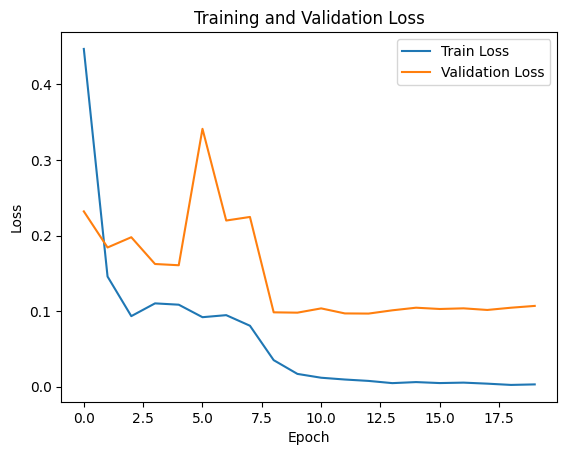

In [ ]:
import matplotlib.pyplot as plt

# Plotting
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

## Test Results

### Top 10

#### train model samples

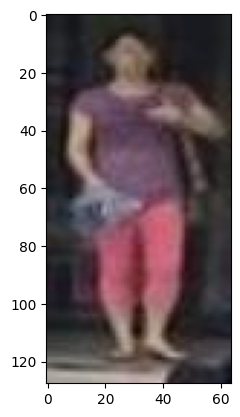

100%|██████████| 321/321 [00:22<00:00, 13.97it/s]


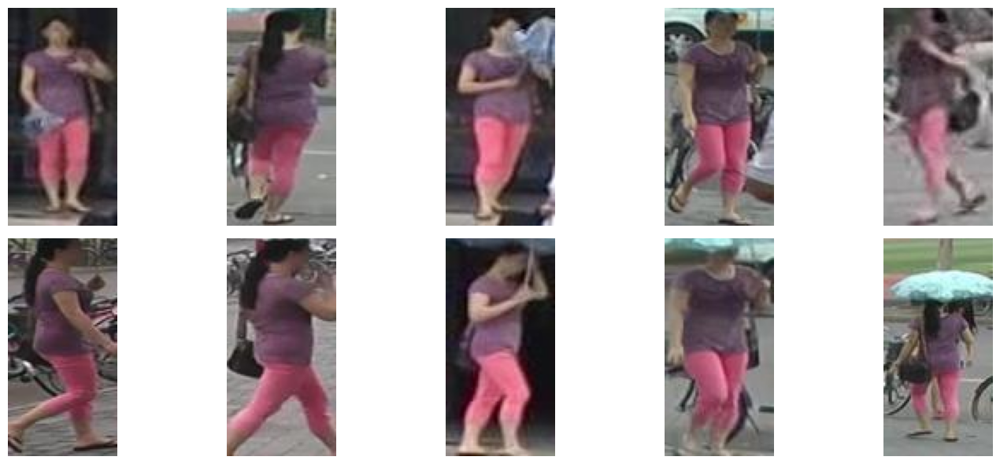

In [ ]:
idx = 11
top_10(train_person_loader,train_single_images, idx)

#### train gt samples

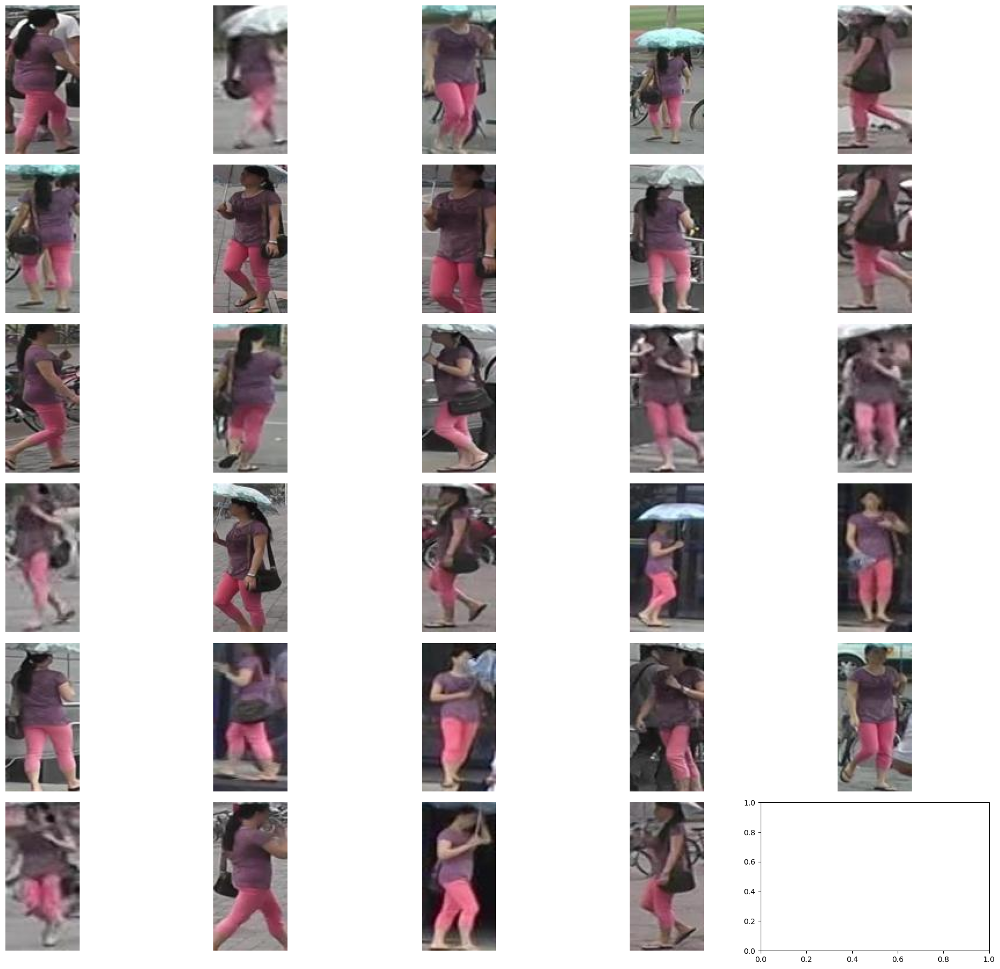

In [ ]:
plot_images(ground_truth(train_single_images, idx))

#### test model

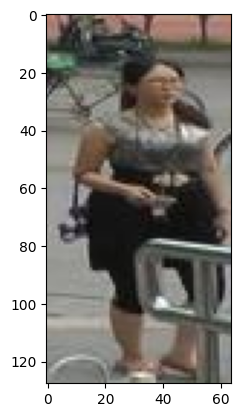

100%|██████████| 35/35 [00:02<00:00, 14.39it/s]


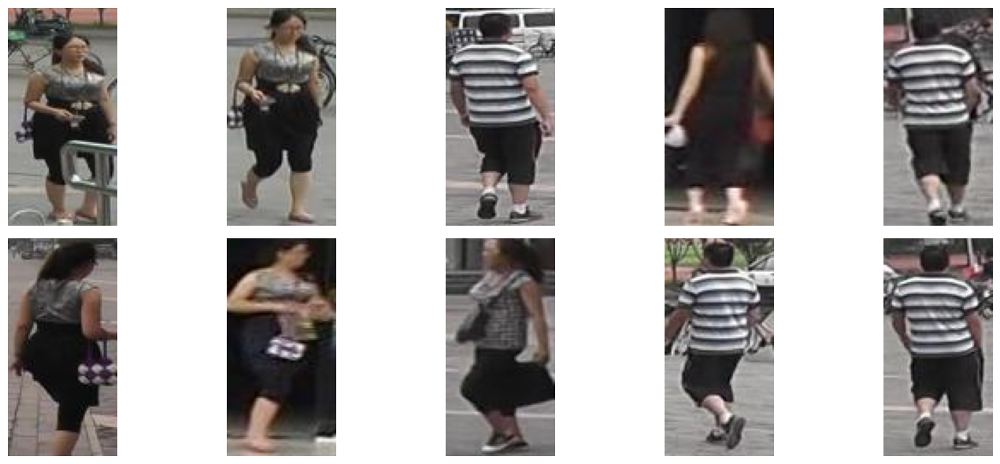

In [ ]:
idx = 1
top_10(val_person_loader,val_single_images, idx)

#### test gt

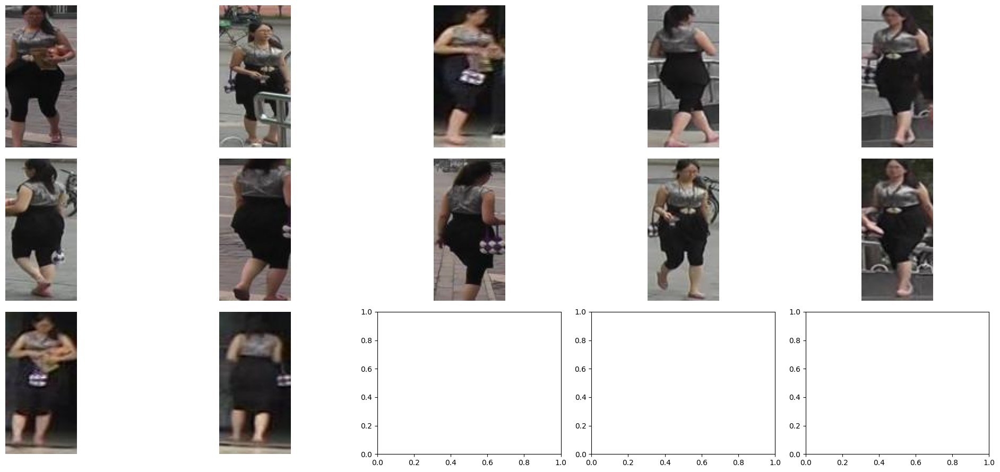

In [ ]:
plot_images(ground_truth(val_single_images, idx))

### ROC

#### ROC train

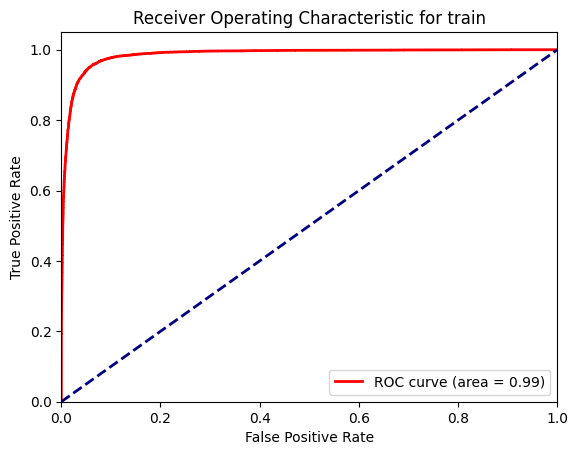

In [62]:
fpr, tpr = plot_roc_curve(model, train_loader, "train")

In [63]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.5020 with corresponding TPR of 0.9982
For target FPR of 0.100, closest achieved FPR is 0.1000 with corresponding TPR of 0.9770
For target FPR of 0.010, closest achieved FPR is 0.0100 with corresponding TPR of 0.7143
For target FPR of 0.001, closest achieved FPR is 0.0010 with corresponding TPR of 0.3031


#### ROC validation

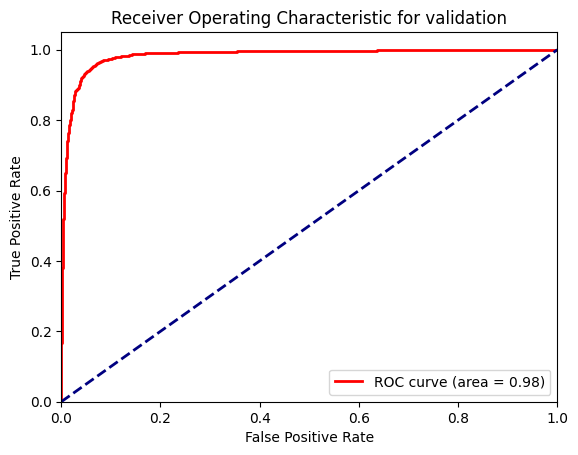

In [64]:
fpr, tpr = plot_roc_curve(model, val_loader, "validation")

In [65]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.4874 with corresponding TPR of 0.9953
For target FPR of 0.100, closest achieved FPR is 0.0990 with corresponding TPR of 0.9737
For target FPR of 0.010, closest achieved FPR is 0.0101 with corresponding TPR of 0.6710
For target FPR of 0.001, closest achieved FPR is 0.0011 with corresponding TPR of 0.1843


## Save model

In [60]:
ckpt_save_path="/content/drive/MyDrive/MSC/Fall2023/AADNN/HW#5/model/ckpt_triplet_margin1_epoch20.ckpt"
save_model(
            file_path=ckpt_save_path,
            model=model,
            optimizer=optimizer,
        )

In [61]:
model = SiameseEfficientNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
model, _ = load_model(ckpt_save_path, model, optimizer)

Loaded pretrained weights for efficientnet-b0


# Train model - Margin: 10

In [ ]:
from tqdm import tqdm
from torch.optim.lr_scheduler import StepLR

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
margin = 10
model = SiameseEfficientNet().to(device)
criterion = TripletLoss(margin)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
lr_scheduler = StepLR(optimizer, step_size=8, gamma=0.1)

epochs = 20

train_loss = []
val_loss = []

# Training loop
for epoch in tqdm(range(1, epochs + 1)):
    model.train()
    loop_train = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc="train", position=0, leave=True)
    avg_train_loss = 0

    for idx, batch in loop_train:
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        optimizer.zero_grad()
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_train_loss+=loss.item()
        loss.backward()
        optimizer.step()

        loop_train.set_description(f"Train - iteration : {epoch}")
        loop_train.set_postfix(
                avg_train_loss="{:.4f}".format(avg_train_loss/idx),
                refresh=True,
            )
    train_loss.append(avg_train_loss/idx)

    model.eval()
    loop_val = tqdm(enumerate(val_loader, 1), total=len(val_loader), desc="val", position=0, leave=True)
    avg_val_loss = 0

    for idx, batch in loop_val:
        optimizer.zero_grad()
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_val_loss+=loss.item()

        loop_val.set_description(f"Val - iteration : {epoch}")
        loop_val.set_postfix(
                avg_val_loss="{:.4f}".format(avg_val_loss/idx),
                refresh=True,
            )
    val_loss.append(avg_val_loss/idx)
    lr_scheduler.step()


Loaded pretrained weights for efficientnet-b0


100%|██████████| 20/20 [49:37<00:00, 148.89s/it]


## train - validation loss

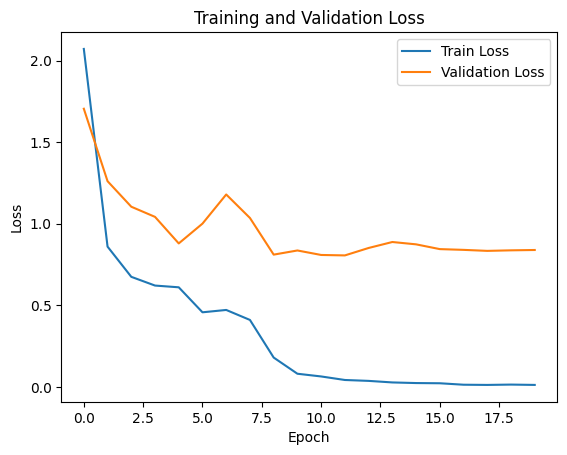

In [ ]:
import matplotlib.pyplot as plt

# Plotting
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

## Test Results

### Top 10

#### train model samples

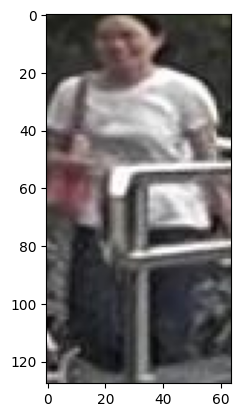

100%|██████████| 331/331 [00:26<00:00, 12.56it/s]


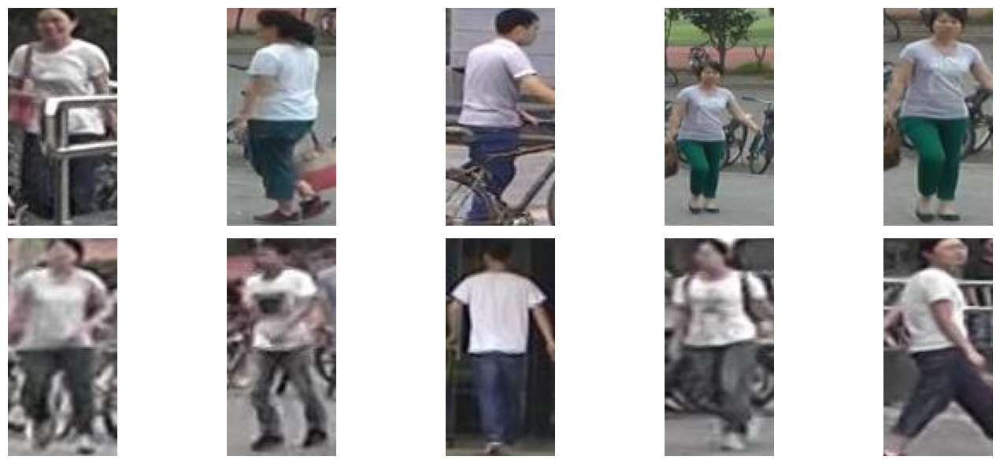

In [ ]:
idx = 1
top_10(train_person_loader,train_single_images, idx)

#### train gt samples

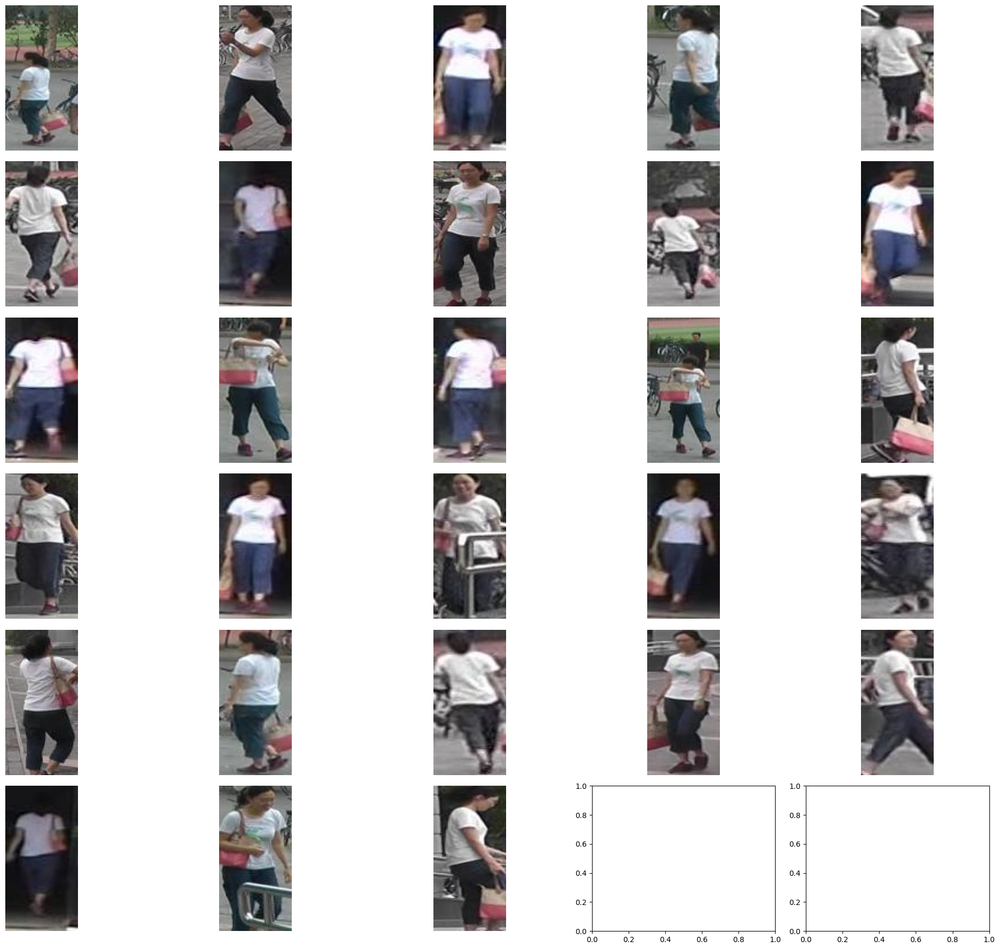

In [ ]:
plot_images(ground_truth(train_single_images, idx))

#### test model

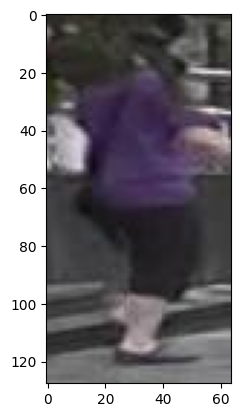

100%|██████████| 42/42 [00:04<00:00, 10.12it/s]


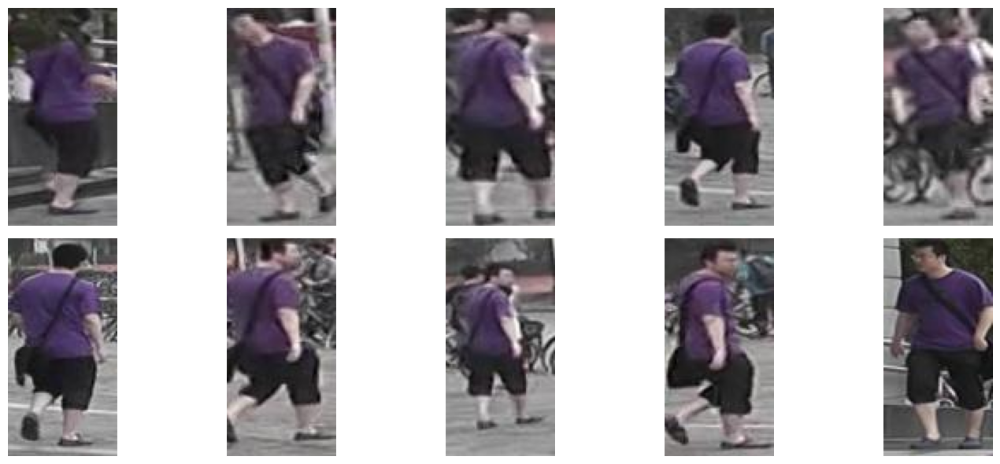

In [ ]:
idx = 1
top_10(val_person_loader,val_single_images, idx)

#### test gt

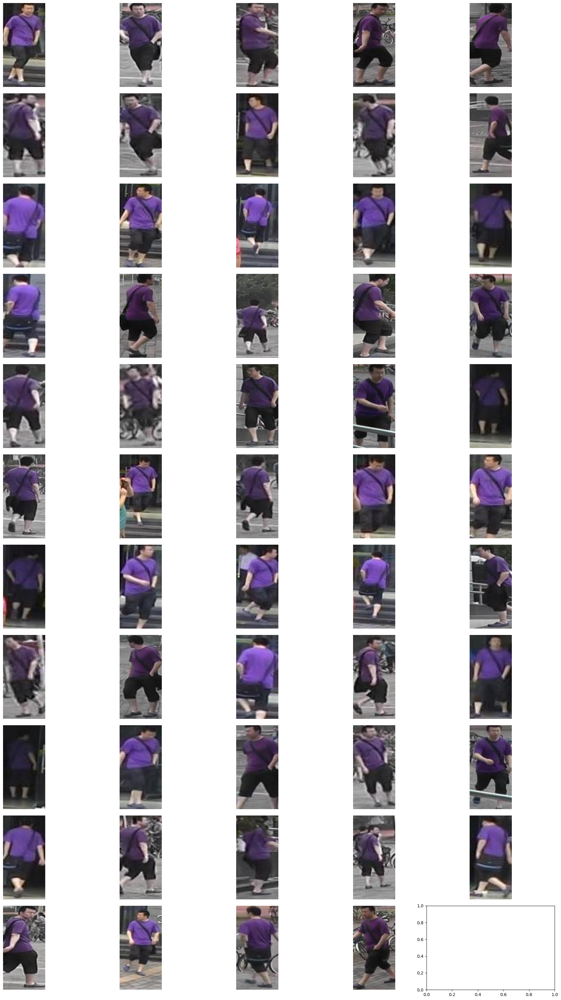

In [ ]:
plot_images(ground_truth(val_single_images, idx))

### ROC

#### ROC train

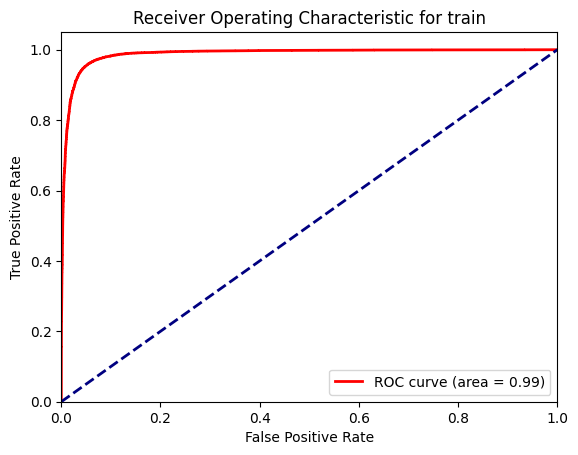

In [54]:
fpr, tpr = plot_roc_curve(model, train_loader, "train")

In [55]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.4989 with corresponding TPR of 0.9983
For target FPR of 0.100, closest achieved FPR is 0.1002 with corresponding TPR of 0.9824
For target FPR of 0.010, closest achieved FPR is 0.0100 with corresponding TPR of 0.7429
For target FPR of 0.001, closest achieved FPR is 0.0010 with corresponding TPR of 0.2956


#### ROC validation

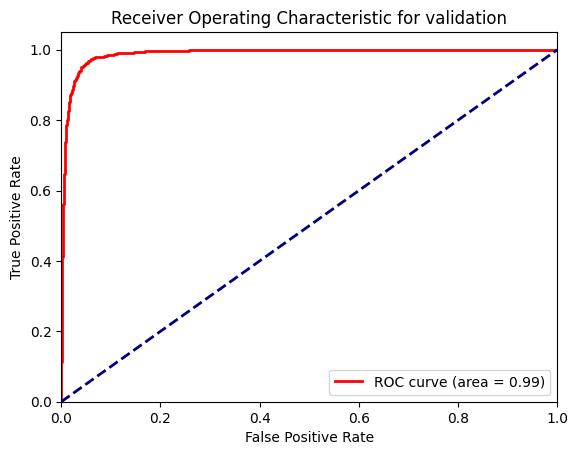

In [56]:
fpr, tpr = plot_roc_curve(model, val_loader, "validation")

In [57]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.4482 with corresponding TPR of 0.9986
For target FPR of 0.100, closest achieved FPR is 0.0997 with corresponding TPR of 0.9849
For target FPR of 0.010, closest achieved FPR is 0.0101 with corresponding TPR of 0.7783
For target FPR of 0.001, closest achieved FPR is 0.0011 with corresponding TPR of 0.1850


## Save model

In [23]:
ckpt_save_path="/content/drive/MyDrive/MSC/Fall2023/AADNN/HW#5/model/ckpt_triplet_margin10_epoch20.ckpt"
save_model(
            file_path=ckpt_save_path,
            model=model,
            optimizer=optimizer,
        )

In [53]:
model = SiameseEfficientNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
model, _ = load_model(ckpt_save_path, model, optimizer)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 135MB/s]


Loaded pretrained weights for efficientnet-b0


# Train model - Margin: 0.1

In [ ]:
from tqdm import tqdm
from torch.optim.lr_scheduler import StepLR

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
margin = .1
model = SiameseEfficientNet().to(device)
criterion = TripletLoss(margin)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
lr_scheduler = StepLR(optimizer, step_size=8, gamma=0.1)

epochs = 20

train_loss = []
val_loss = []

# Training loop
for epoch in tqdm(range(1, epochs + 1)):
    model.train()
    loop_train = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc="train", position=0, leave=True)
    avg_train_loss = 0

    for idx, batch in loop_train:
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        optimizer.zero_grad()
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_train_loss+=loss.item()
        loss.backward()
        optimizer.step()

        loop_train.set_description(f"Train - iteration : {epoch}")
        loop_train.set_postfix(
                avg_train_loss="{:.4f}".format(avg_train_loss/idx),
                refresh=True,
            )
    train_loss.append(avg_train_loss/idx)

    model.eval()
    loop_val = tqdm(enumerate(val_loader, 1), total=len(val_loader), desc="val", position=0, leave=True)
    avg_val_loss = 0

    for idx, batch in loop_val:
        optimizer.zero_grad()
        img1, img2, img3 = batch
        img1, img2, img3 = img1.to(device), img2.to(device), img3.to(device)
        output1, output2, output3 = model(img1, img2, img3)
        loss = criterion(output1, output2, output3)
        avg_val_loss+=loss.item()

        loop_val.set_description(f"Val - iteration : {epoch}")
        loop_val.set_postfix(
                avg_val_loss="{:.4f}".format(avg_val_loss/idx),
                refresh=True,
            )
    val_loss.append(avg_val_loss/idx)
    lr_scheduler.step()


Loaded pretrained weights for efficientnet-b0


100%|██████████| 20/20 [49:57<00:00, 149.86s/it]


## train - validation loss

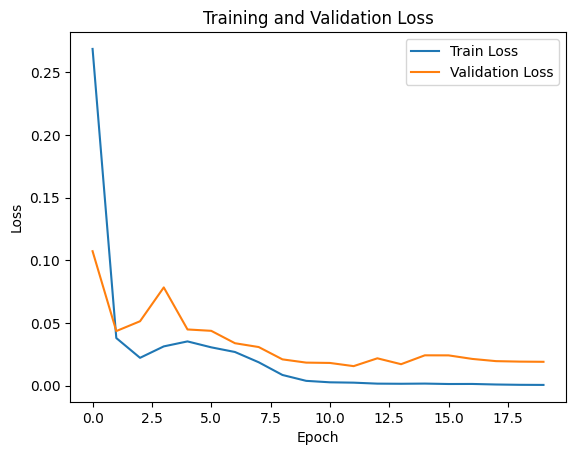

In [ ]:
import matplotlib.pyplot as plt

# Plotting
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

## Test Results

### Top 10

#### train model samples

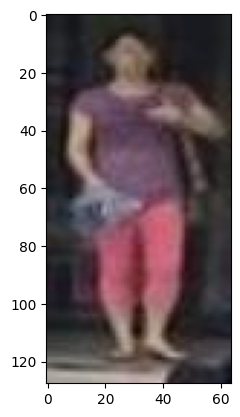

100%|██████████| 321/321 [00:25<00:00, 12.72it/s]


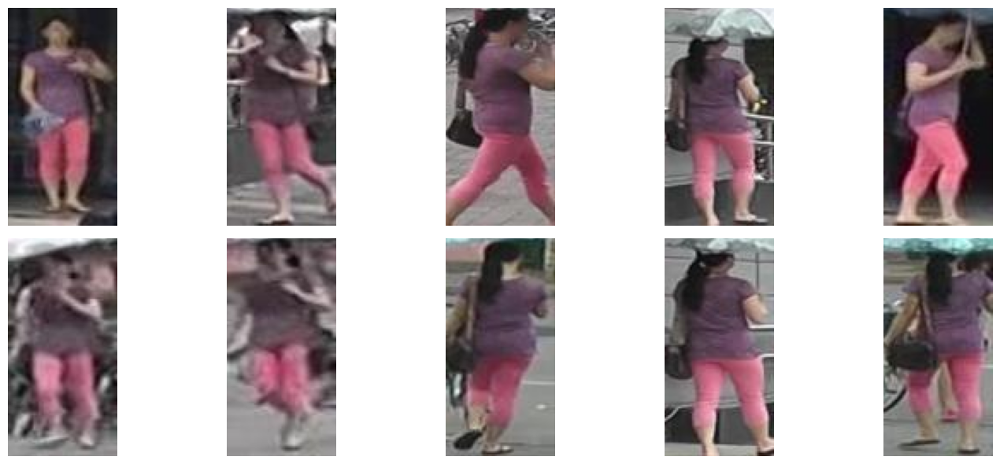

In [ ]:
idx = 11
top_10(train_person_loader,train_single_images, idx)

#### train gt samples

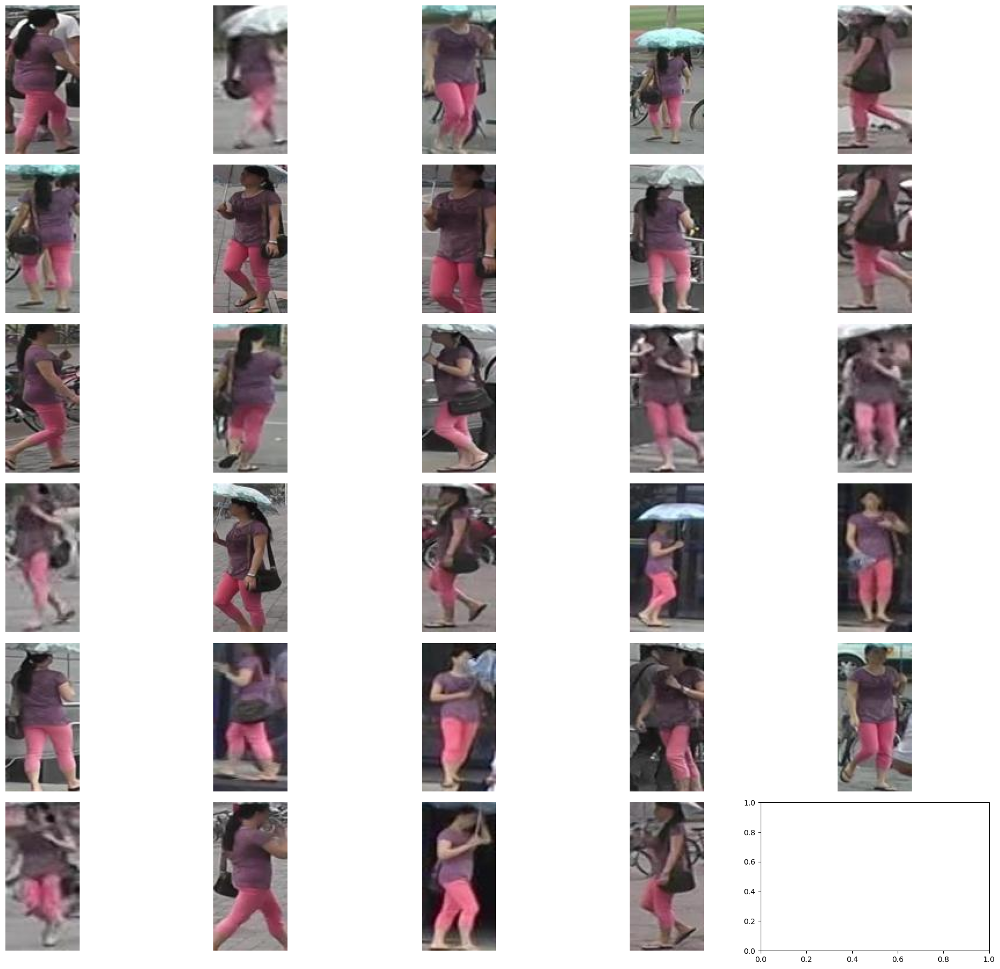

In [ ]:
plot_images(ground_truth(train_single_images, idx))

#### test model

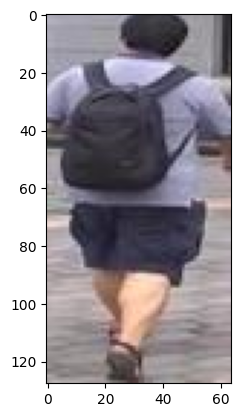

100%|██████████| 35/35 [00:02<00:00, 14.71it/s]


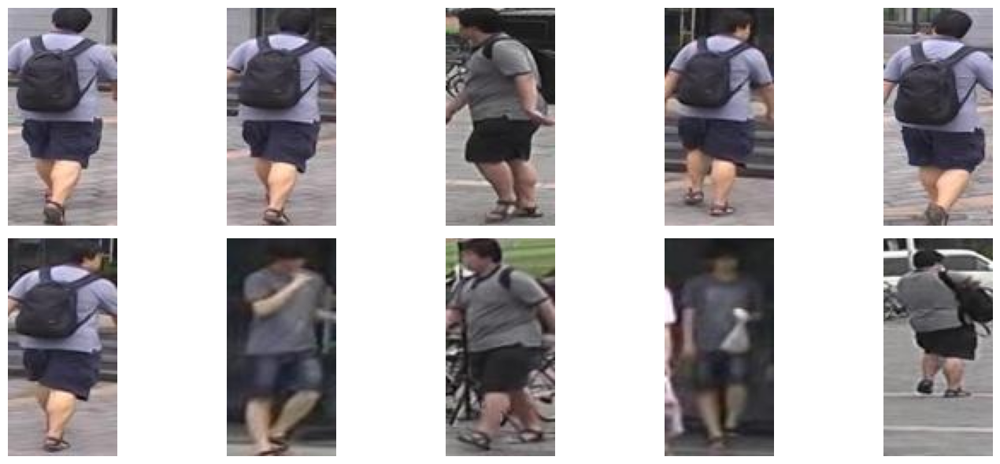

In [ ]:
idx = 11
top_10(val_person_loader,val_single_images, idx)

#### test gt

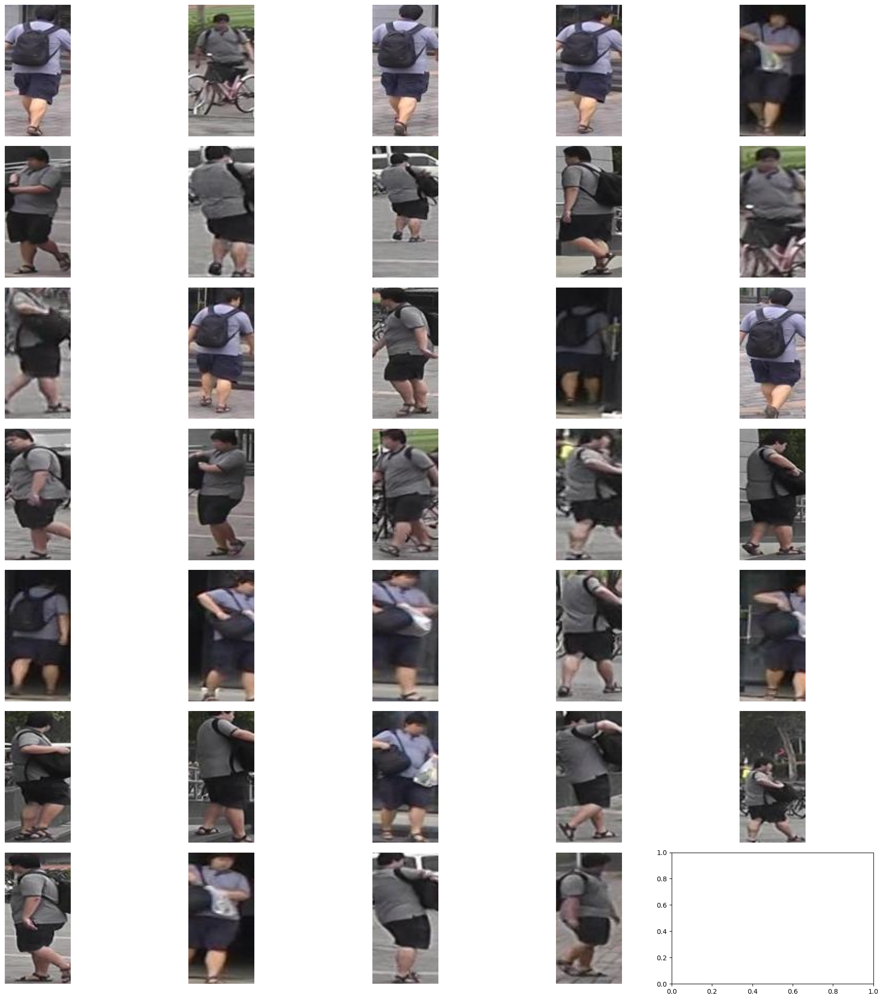

In [ ]:
plot_images(ground_truth(val_single_images, idx))

### ROC

#### ROC train

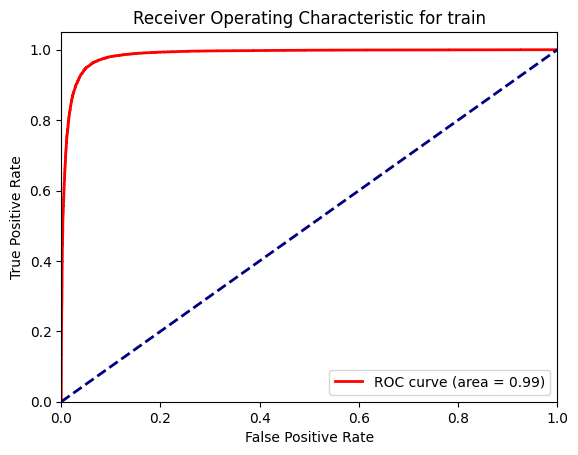

In [70]:
fpr, tpr = plot_roc_curve(model, train_loader, "train")

In [71]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.4903 with corresponding TPR of 0.9984
For target FPR of 0.100, closest achieved FPR is 0.1000 with corresponding TPR of 0.9805
For target FPR of 0.010, closest achieved FPR is 0.0100 with corresponding TPR of 0.7269
For target FPR of 0.001, closest achieved FPR is 0.0010 with corresponding TPR of 0.2633


#### ROC validation

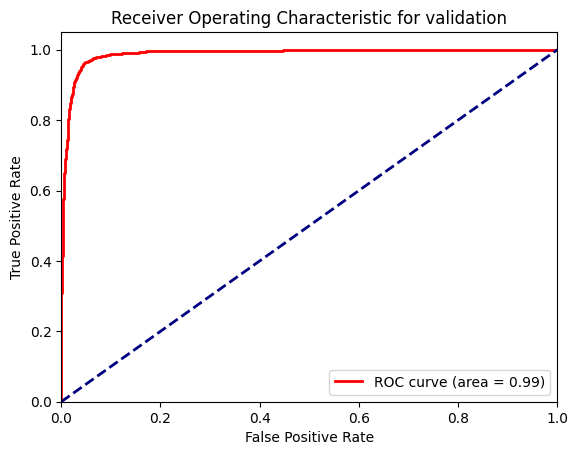

In [72]:
fpr, tpr = plot_roc_curve(model, val_loader, "validation")

In [73]:
calc_fpr_tpr(fpr, tpr)

For target FPR of 0.500, closest achieved FPR is 0.4536 with corresponding TPR of 0.9978
For target FPR of 0.100, closest achieved FPR is 0.0990 with corresponding TPR of 0.9863
For target FPR of 0.010, closest achieved FPR is 0.0101 with corresponding TPR of 0.7005
For target FPR of 0.001, closest achieved FPR is 0.0011 with corresponding TPR of 0.3107


## Save model

In [68]:
ckpt_save_path="/content/drive/MyDrive/MSC/Fall2023/AADNN/HW#5/model/ckpt_triplet_margin0_1_epoch20.ckpt"
save_model(
            file_path=ckpt_save_path,
            model=model,
            optimizer=optimizer,
        )

In [69]:
model = SiameseEfficientNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
model, _ = load_model(ckpt_save_path, model, optimizer)

Loaded pretrained weights for efficientnet-b0
